In [1]:
import Pkg
Pkg.activate(".")
Pkg.instantiate()
using Plots, QuadGK, Dierckx, SpecialFunctions, LaTeXStrings
V(x) = x^4/4 - x^2/2


  Activating project at `~/Desktop/tpt_code`


V (generic function with 1 method)

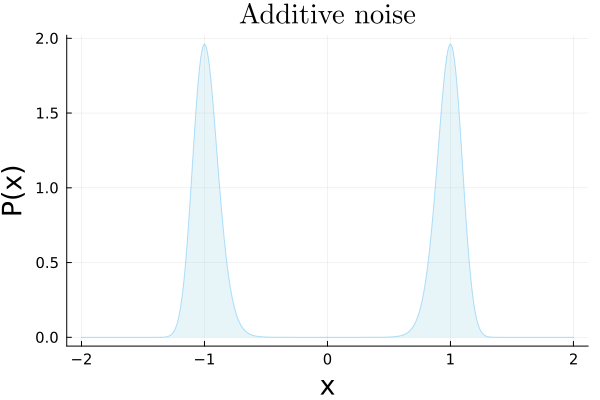

In [2]:
sigma = 0.3
rg = -2:0.01:2
Ps_add(x, sigma) = 1/sigma^2 * exp.((-2*V.(x))/sigma^2)
Nps, error = quadgk(x -> Ps_add(x, 0.2), -Inf, Inf, rtol=1e-8)
plot(rg, Ps_add(rg, 0.2)/Nps, fillrange = zero(rg), fc=:blues, alpha=0.3, xlab = "x", ylab = "P(x)", label = false,  title = "Additive noise", titlefont = font(18,"Computer Modern"), labelsize = 2,  ytickfont=font(10), xtickfont=font(10), guidefont=font(18), legenfont = font(18))


In [3]:
#export the tpt statistics for multiplicative noise
function find_value_mul(sigma, alpha = 0.5, bd = 0.1)
    g(x) = sigma/4*(x^4 - 4*x^2 + 8)
    #Ps_mul(x) = 16/sigma^2 * exp(-2*log(x^4-4x^2+8)+1/sigma^2*(atan(1-x^2/2)-2*(x^2-6)/(x^4-4x^2+8)))
    #Ps_mul(x) = 16/sigma^2 * exp(-2*log(x^4-4x^2+8)+1/sigma^2*(alpha*log(8-4*x^2+x^4)+atan(1-x^2/2)-2*(x^2-6)/(x^4-4x^2+8)))
    #Ps_mul(x) = 16/sigma^2 * exp(-2*log(x^4-4x^2+8)+1/sigma^2*(-alpha*log(8-4*x^2+x^4)+atan(1-x^2/2)-2*(x^2-6)/(x^4-4x^2+8)))
    Ps_mul(x) = 16/sigma^2 * exp(-2*log(x^4-4x^2+8)+1/sigma^2*(atan(1-x^2/2)-2*(x^2-6)/(x^4-4x^2+8))) * (x^4-4*x^2+8)^(-alpha)
    Nps, error = quadgk(x -> Ps_mul(x), -Inf, Inf, rtol=1e-5)
    x_grid = range(-1.5,0,10^5);
    min_index = findmax(Ps_mul.(x_grid))[2];
    left_min = x_grid[min_index];
    right_min = -left_min;
    #dq(x) = exp(32*(1/32*(atan(1/2*(-2+x^2)))+(-6+x^2)/(16*(8-4x^2+x^4)))/sigma^2)
    dq(x) = exp((atan(-1+x^2/2)+2*(x^2-6)/(x^4-4x^2+8))/sigma^2)*(8-4x^2+x^4)^(2*alpha)
    Nq, error = quadgk(x -> dq(x), left_min+bd, right_min-bd, rtol=1e-5)
    x_grid = range(left_min+bd,right_min-bd,10^5)
    q_grid = zeros(100000)
    for i in 1:100000
        q_grid[i] = quadgk(x -> dq(x), left_min+bd, x_grid[i], rtol=1e-5)[1]
        q_grid[i]  = q_grid[i]/Nq
    end
    muAB_grid = Ps_mul.(x_grid)/Nps.*q_grid.*(1 .-q_grid)
    spl = Spline1D(x_grid, muAB_grid)
   NmuAB = integrate(spl, left_min+bd, right_min-bd)
    JAB = 1/2*Ps_mul.(x_grid).*g.(x_grid).^2 .*dq.(x_grid)*1/Nps
    Vab, error =  quadgk(x -> dq(x)^2*g(x)^2*Ps_mul(x)*1/2/Nps, left_min+bd, right_min-bd, rtol=1e-5)
return x_grid, muAB_grid/NmuAB, q_grid, JAB, Ps_mul.(-2:0.01:2)/Nps, Vab, NmuAB/Vab
end

find_value_mul (generic function with 3 methods)

In [6]:
x_grid_mul1, muAB_grid_mul1, q_grid1, JAB1, _, _,_= find_value_mul(0.2,0.5,0.2)
x_grid_mul2, muAB_grid_mul2, q_grid2, _, _, _,_= find_value_mul(0.6,0.5,0.2)
x_grid_mul3, muAB_grid_mul3, q_grid3, _, _, _,_= find_value_mul(2.5,0.5,0.2)

p1=plot(x_grid_mul1, muAB_grid_mul1, label = L"\sigma = 0.20", labelsize = 1.5,  ytickfont=font(15), xtickfont=font(15), guidefont=font(25), legendfont = font(14), size = (600, 400), framestyle = :box);
plot!(x_grid_mul2, muAB_grid_mul2, label = L"\sigma = 0.6");
plot!(x_grid_mul3, muAB_grid_mul3, label = L"\sigma = 2.5", xlab = L"x",ylab = L"\rho_{AB}(x)" ,foreground_color_legend = nothing, grid = false, title ="Statonovich", labelsize = 1.5, titlefont = font(25), legend = false)
savefig("figure/1d_Stra.pdf")
p1

In [5]:
x_grid_mul1, muAB_grid_mul1, q_grid1, JAB1, _, _,_= find_value_mul(0.2,1.0,0.2)
x_grid_mul2, muAB_grid_mul2, q_grid2, _, _, _,_= find_value_mul(0.6,1.0,0.2)
x_grid_mul3, muAB_grid_mul3, q_grid3, _, _, _,_= find_value_mul(2.5,1.0,0.2)

p2=plot(x_grid_mul1, muAB_grid_mul1, label = L"\sigma = 0.20", labelsize = 1.5,  ytickfont=font(15), xtickfont=font(15), guidefont=font(25), legendfont = font(14), size = (600, 400), framestyle = :box);
plot!(x_grid_mul2, muAB_grid_mul2, label = L"\sigma = 0.6");
plot!(x_grid_mul3, muAB_grid_mul3, label = L"\sigma = 2.5", xlab = L"x",ylab = L"\rho_{AB}(x)" ,foreground_color_legend = nothing, grid = false, title ="Anti-Ito", labelsize = 1.5, titlefont = font(25), legend = false)
savefig("figure/1d_anti_ito.pdf")
p2

In [7]:
x_grid_mul1, muAB_grid_mul1, q_grid1, JAB1, _, _,_= find_value_mul(0.2,0,0.1)
x_grid_mul2, muAB_grid_mul2, q_grid2, _, _, _,_= find_value_mul(0.6,0,0.1)
x_grid_mul3, muAB_grid_mul3, q_grid3, _, _, _,_= find_value_mul(2.5,0,0.1)

p1=plot(x_grid_mul1, muAB_grid_mul1, label = L"\sigma = 0.20", labelsize = 1.5,  ytickfont=font(15), xtickfont=font(15), guidefont=font(25), legendfont = font(14), size = (600, 400), framestyle = :box);
plot!(x_grid_mul2, muAB_grid_mul2, label = L"\sigma = 0.6");
plot!(x_grid_mul3, muAB_grid_mul3, label = L"\sigma = 2.5", xlab = L"x",ylab = L"\rho_{AB}(x)" ,foreground_color_legend = nothing, grid = false, title ="Small Boundary" , labelsize = 1.5, titlefont = font(25), legend = false)
savefig("figure/1d_small_boundary.pdf")
p1

In [8]:
x_grid_mul1, muAB_grid_mul1, q_grid1, JAB1, _, _,_= find_value_mul(0.2,0,0.3)
x_grid_mul2, muAB_grid_mul2, q_grid2, _, _, _,_= find_value_mul(0.6,0,0.3)
x_grid_mul3, muAB_grid_mul3, q_grid3, _, _, _,_= find_value_mul(2.5,0,0.3)

p1=plot(x_grid_mul1, muAB_grid_mul1, label = L"\sigma = 0.20", labelsize = 1.5,  ytickfont=font(15), xtickfont=font(15), guidefont=font(25), legendfont = font(14), size = (600, 400), framestyle = :box);
plot!(x_grid_mul2, muAB_grid_mul2, label = L"\sigma = 0.6");
plot!(x_grid_mul3, muAB_grid_mul3, label = L"\sigma = 2.5", xlab = L"x",ylab = L"\rho_{AB}(x)" ,foreground_color_legend = nothing, grid = false, title ="Big Boundary" , labelsize = 1.5, titlefont = font(25), legend = false)
savefig("figure/1d_Big_boundary.pdf")
p1

In [9]:
import Pkg
Pkg.activate(".")
Pkg.instantiate()
using Ferrite, SparseArrays, LinearAlgebra
using FerriteGmsh
using PyCall
using Plots
using LaTeXStrings
include("reactive_stats_struct.jl")
include("commonitors.jl")

function trans_stat(result_loc::Vector{Vector{Float64}}, base_info::grid_info, react_stat::reactive_stat, length::Int64)
    points = [Vec((x, y)) for y in range(result_loc[2][1], result_loc[2][2], length=length) for x in range(result_loc[1][1],result_loc[1][2],length = length)];
    ph_stat = PointEvalHandler(base_info.grid_stat, points, warn = false);
    ph_comm = PointEvalHandler(base_info.grid_comm, points, warn = false);

    u_points_stat = Ferrite.get_point_values(ph_stat, base_info.dh_stat, react_stat.u_stat, :u);
    u_points_forward = Ferrite.get_point_values(ph_comm, base_info.dh_comm, react_stat.u_forward, :u);
    u_points_back = Ferrite.get_point_values(ph_comm, base_info.dh_comm, react_stat.u_backward, :u);

    distribution_points = get_point_values(ph_comm, L2Projector(base_info.ip, base_info.grid_comm), react_stat.reactive_density);
    distribution_points = permutedims(hcat(distribution_points...));

    current_points = get_point_values(ph_comm, L2Projector(base_info.ip, base_info.grid_comm), react_stat.reactive_current);
    current_points = permutedims(hcat(current_points...));

    return u_points_forward, u_points_back, u_points_stat, distribution_points, current_points
end

function obtain_TPT(grid_loc::Vector{Vector{Float64}}, range_loc::Vector{Vector{Float64}}, 
    g::Vector{Function}, D::Matrix{Function})
    #initialize the information of grid 
    base_info = grid_info();

    base_info.grid_stat = create_rect_mesh(grid_loc[1],grid_loc[2], grid_loc[3], grid_loc[4]);
    base_info.dh_stat = create_dofhandler(base_info.grid_stat);
    #implement the information of boundary conditions, and diffusion matrix 
    implement_grid(base_info, D, g)
    #initialize the reactive statistics 
    react_stat = reactive_stat();
    compute_stat_dist(base_info, react_stat)
    implement_grid(range_loc,grid_loc, base_info, react_stat)

    obtain_commonitor(base_info, react_stat);
    return base_info, react_stat
end


function export_result(base_info::grid_info, react_stat::reactive_stat, 
    stat_loc::Vector{Vector{Float64}}, current_loc::Vector{Vector{Float64}}, level::Int64)
    mfpt = react_stat.Z_normalization /react_stat.transition_rate
    _,_ ,_ ,_ , current_points = trans_stat(current_loc, base_info, react_stat, level);
    _,_ ,u_points_stat , distribution_points, _ = trans_stat(stat_loc, base_info, react_stat, 200);
    return react_stat.transition_rate, mfpt, u_points_stat, distribution_points, current_points
end

function export_committor(base_info::grid_info, react_stat::reactive_stat, stat_loc::Vector{Vector{Float64}})
    forward_u,backward_u ,_ ,_ , _ = trans_stat(stat_loc, base_info, react_stat, 200);
    return forward_u, backward_u
end

function arrow0!(x, y, u, v; as=0.1, lw=1, lc=:black, la=1)
    nuv = sqrt(u^2 + v^2)
    v1, v2 = [u;v] / nuv,  [-v;u] / nuv
    v4 = (3*v1 + v2)/3.1623  # sqrt(10) to get unit vector
    v5 = v4 - 2*(v4'*v2)*v2
    v4, v5 = as*nuv*v4, as*nuv*v5
    plot!([x,x+u], [y,y+v], lw=lw, lc=lc, la=la, label = false)
    plot!([x+u,x+u-v5[1]], [y+v,y+v-v5[2]], lw=lw, lc=lc, la=la, label = false)
    plot!([x+u,x+u-v4[1]], [y+v,y+v-v4[2]], lw=lw, lc=lc, la=la, label = false)
end

meshgrid(x, y) = (repeat(x, outer=length(y)), repeat(y, inner=length(x)))

function implement_grid(range_loc::Vector{Vector{Float64}}, grid_loc::Vector{Vector{Float64}}, b::grid_info, react_stat::reactive_stat)
    #center and radius of attracting states 
    st_A = range_loc[1];ed_A = range_loc[2]; st_B = range_loc[3];ed_B = range_loc[4];
    A_center, A_radius = findcenter_radius(st_A, ed_A, b, react_stat)
    B_center, B_radius = findcenter_radius(st_B, ed_B, b, react_stat)
    A_radius = 0.25;
    B_radius = 0.25;
    b.grid_comm = create_rect_mesh_comm(A_center, A_radius, B_center, B_radius, grid_loc[1],grid_loc[2], grid_loc[3], grid_loc[4])
    b.dh_comm = create_dofhandler(b.grid_comm);
    ∂A, ∂B  = obtain_boundary(b.grid_comm, 0);
    ∂outer = obtain_boundary(b.grid_stat, 1);
    b.dbc_for = create_bc(b.dh_comm,"forward", b.cellvalues_forward, ∂A, ∂B, ∂outer);
    b.dbc_back = create_bc(b.dh_comm,"backward", b.cellvalues_backward, ∂A, ∂B, ∂outer);
end

  Activating project at `~/Desktop/tpt_code`


implement_grid (generic function with 2 methods)

In [10]:
#drift function
g1(x) = -x[1]^3+x[1]; g2(x) = -x[2];
g = [g1, g2]

2-element Vector{Function}:
 g1 (generic function with 1 method)
 g2 (generic function with 1 method)

In [11]:
sigma = 0.6
D11(x) = sigma^2*(x[1]^4 - x[1]^2+1)^2; D12(x) = 0 ;D21(x) = 0; D22(x) = sigma^2;
#drift function
g3(x) = -x[1]^3+x[1]+0.5*sigma^4*(4*x[1]^3-2*x[1])*(x[1]^4-x[1]^2+1); g4(x) = -x[2];
h = [g3, g4]

D = [D11 D12;D21 D22];
grid_loc = [[-2.5, -2.5],[-2.5,2.5],[2.5, -2.5],[2.5,2.5]];
range_loc = [[-1.8, -1.6],[0,1.6],[0,-1.6],[1.8,1.6]];
stat_loc = [[-1.75,1.75],[-1.5,1.5]];
curr_loc = [[-1.2,1.2],[-0.8,0.8]];
level = 7
base_info, react_stat = obtain_TPT(grid_loc, range_loc, h, D);
tp1_mul_rate2, tp1_mul_mfpt2, tp1_mul_stat2, tp1_mul_distribution2, tp1_mul_current2 = export_result(base_info, react_stat, stat_loc, curr_loc, level);

Info    : Meshing 1D...
Info    : [  0%] Meshing curve 5 (Line)
Info    : [ 30%] Meshing curve 6 (Line)
Info    : [ 50%] Meshing curve 7 (Line)
Info    : [ 80%] Meshing curve 8 (Line)
Info    : Done meshing 1D (Wall 0.000217875s, CPU 0.000208s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.244443s, CPU 0.242761s)
Info    : 11823 nodes 23648 elements
Info    : Meshing 1D...
Info    : [  0%] Meshing curve 9 (Ellipse)
Info    : [ 20%] Meshing curve 10 (Ellipse)
Info    : [ 40%] Meshing curve 11 (Line)
Info    : [ 50%] Meshing curve 12 (Line)
Info    : [ 70%] Meshing curve 13 (Line)
Info    : [ 90%] Meshing curve 14 (Line)
Info    : Done meshing 1D (Wall 0.000296709s, CPU 0.000275s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.17697s, CPU 0.174631s)
Info    : 11910 nodes 23828 elements


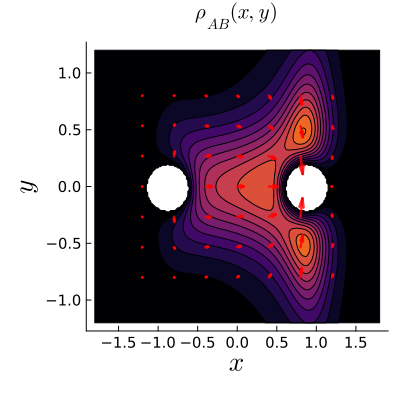

In [12]:
x = range(-1.2, 1.2, length=7);y = range(-0.8, 0.8, length=7);
x_mesh, y_mesh = meshgrid(x, y);
x = range(-1.8, 1.8, length=200);y = range(-1.2, 1.2, length=200);
p1 = contourf(x,y,tp1_mul_distribution2[:,1], title = L"\rho_{AB}(x,y)", xlab = L"x", ylab = L"y", size = (400,400), clim = (0, 0.6), legend = false,ytickfont=font(10), xtickfont=font(10), guidefont=font(18), legenfont = font(18), grid = false)
arrow0!.(x_mesh, y_mesh, tp1_mul_current2[:,1].*5, tp1_mul_current2[:,2].*5; as=0.5, lw=2.5,lc=:red, la=0.8);
Plots.current()
savefig("figure/2d_Stra.pdf")
p1

In [13]:
sigma = 0.6
D11(x) = sigma^2*(x[1]^4 - x[1]^2+1)^2; D12(x) = 0 ;D21(x) = 0; D22(x) = sigma^2;
#drift function
g3(x) = -x[1]^3+x[1]+1*sigma^4*(4*x[1]^3-2*x[1])*(x[1]^4-x[1]^2+1); g4(x) = -x[2];
h = [g3, g4]
D = [D11 D12;D21 D22];
grid_loc = [[-2.5, -2.5],[-2.5,2.5],[2.5, -2.5],[2.5,2.5]];
range_loc = [[-1.8, -1.6],[0,1.6],[0,-1.6],[1.8,1.6]];
stat_loc = [[-1.75,1.75],[-1.5,1.5]];
curr_loc = [[-1.2,1.2],[-0.8,0.8]];
level = 7
base_info, react_stat = obtain_TPT(grid_loc, range_loc, h, D);
tp1_mul_rate2, tp1_mul_mfpt2, tp1_mul_stat2, tp1_mul_distribution2, tp1_mul_current2 = export_result(base_info, react_stat, stat_loc, curr_loc, level);

Info    : Meshing 1D...
Info    : [  0%] Meshing curve 5 (Line)
Info    : [ 30%] Meshing curve 6 (Line)
Info    : [ 50%] Meshing curve 7 (Line)
Info    : [ 80%] Meshing curve 8 (Line)
Info    : Done meshing 1D (Wall 0.000313542s, CPU 0.000297s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.273478s, CPU 0.268405s)
Info    : 11823 nodes 23648 elements
Info    : Meshing 1D...
Info    : [  0%] Meshing curve 9 (Ellipse)
Info    : [ 20%] Meshing curve 10 (Ellipse)
Info    : [ 40%] Meshing curve 11 (Line)
Info    : [ 50%] Meshing curve 12 (Line)
Info    : [ 70%] Meshing curve 13 (Line)
Info    : [ 90%] Meshing curve 14 (Line)
Info    : Done meshing 1D (Wall 0.000349208s, CPU 0.000277s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.181898s, CPU 0.177408s)
Info    : 11910 nodes 23828 elements


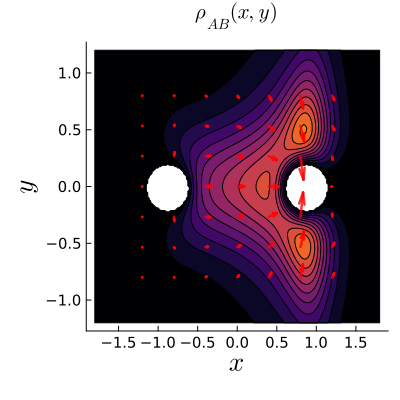

In [14]:
p1 = contourf(x,y,tp1_mul_distribution2[:,1], title = L"\rho_{AB}(x,y)", xlab = L"x", ylab = L"y", size = (400,400), clim = (0, 0.6), legend = false,ytickfont=font(10), xtickfont=font(10), guidefont=font(18), legenfont = font(18), grid = false)
arrow0!.(x_mesh, y_mesh, tp1_mul_current2[:,1].*5, tp1_mul_current2[:,2].*5; as=0.5, lw=2.5,lc=:red, la=0.8);
Plots.current()
savefig("figure/2d_anti_ito.pdf")
p1

In [15]:
function implement_grid(range_loc::Vector{Vector{Float64}}, grid_loc::Vector{Vector{Float64}}, b::grid_info, react_stat::reactive_stat)
    #center and radius of attracting states 
    st_A = range_loc[1];ed_A = range_loc[2]; st_B = range_loc[3];ed_B = range_loc[4];
    A_center, A_radius = findcenter_radius(st_A, ed_A, b, react_stat)
    B_center, B_radius = findcenter_radius(st_B, ed_B, b, react_stat)
    A_radius = 0.15;
    B_radius = 0.15;
    b.grid_comm = create_rect_mesh_comm(A_center, A_radius, B_center, B_radius, grid_loc[1],grid_loc[2], grid_loc[3], grid_loc[4])
    b.dh_comm = create_dofhandler(b.grid_comm);
    ∂A, ∂B  = obtain_boundary(b.grid_comm, 0);
    ∂outer = obtain_boundary(b.grid_stat, 1);
    b.dbc_for = create_bc(b.dh_comm,"forward", b.cellvalues_forward, ∂A, ∂B, ∂outer);
    b.dbc_back = create_bc(b.dh_comm,"backward", b.cellvalues_backward, ∂A, ∂B, ∂outer);
end

implement_grid (generic function with 2 methods)

In [16]:
g1(x) = -x[1]^3+x[1]; g2(x) = -x[2];
g = [g1, g2]
sigma = 0.6
D11(x) = sigma^2*(x[1]^4 - x[1]^2+1)^2; D12(x) = 0 ;D21(x) = 0; D22(x) = sigma^2;
D = [D11 D12;D21 D22];
grid_loc = [[-2.5, -2.5],[-2.5,2.5],[2.5, -2.5],[2.5,2.5]];
range_loc = [[-1.8, -1.6],[0,1.6],[0,-1.6],[1.8,1.6]];
stat_loc = [[-1.75,1.75],[-1.5,1.5]];
curr_loc = [[-1.2,1.2],[-0.8,0.8]];
level = 7
base_info, react_stat = obtain_TPT(grid_loc, range_loc, g, D);
tp1_mul_rate2, tp1_mul_mfpt2, tp1_mul_stat2, tp1_mul_distribution2, tp1_mul_current2 = export_result(base_info, react_stat, stat_loc, curr_loc, level);

Info    : Meshing 1D...
Info    : [  0%] Meshing curve 5 (Line)
Info    : [ 30%] Meshing curve 6 (Line)
Info    : [ 50%] Meshing curve 7 (Line)
Info    : [ 80%] Meshing curve 8 (Line)
Info    : Done meshing 1D (Wall 0.000285708s, CPU 0.000269s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.260996s, CPU 0.257244s)
Info    : 11823 nodes 23648 elements
Info    : Meshing 1D...
Info    : [  0%] Meshing curve 9 (Ellipse)
Info    : [ 20%] Meshing curve 10 (Ellipse)
Info    : [ 40%] Meshing curve 11 (Line)
Info    : [ 50%] Meshing curve 12 (Line)
Info    : [ 70%] Meshing curve 13 (Line)
Info    : [ 90%] Meshing curve 14 (Line)
Info    : Done meshing 1D (Wall 0.000319542s, CPU 0.000274s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.192636s, CPU 0.188011s)
Info    : 11919 nodes 23846 elements


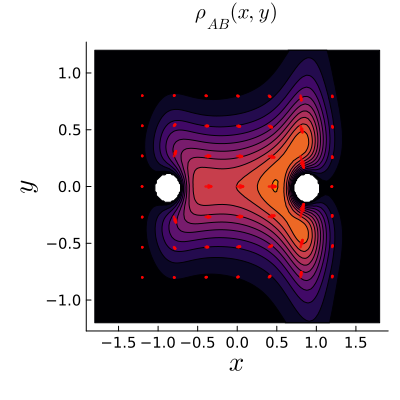

In [17]:
x = range(-1.2, 1.2, length=7);y = range(-0.8, 0.8, length=7);
x_mesh, y_mesh = meshgrid(x, y);
x = range(-1.8, 1.8, length=200);y = range(-1.2, 1.2, length=200);
p1 = contourf(x,y,tp1_mul_distribution2[:,1], title = L"\rho_{AB}(x,y)", xlab = L"x", ylab = L"y", size = (400,400), clim = (0, 0.6), legend = false,ytickfont=font(10), xtickfont=font(10), guidefont=font(18), legenfont = font(18), grid = false)
arrow0!.(x_mesh, y_mesh, tp1_mul_current2[:,1].*5, tp1_mul_current2[:,2].*5; as=0.5, lw=2.5,lc=:red, la=0.8);
Plots.current()
savefig("figure/2d_boundary_small.pdf")
p1

In [18]:
function implement_grid(range_loc::Vector{Vector{Float64}}, grid_loc::Vector{Vector{Float64}}, b::grid_info, react_stat::reactive_stat)
    #center and radius of attracting states 
    st_A = range_loc[1];ed_A = range_loc[2]; st_B = range_loc[3];ed_B = range_loc[4];
    A_center, A_radius = findcenter_radius(st_A, ed_A, b, react_stat)
    B_center, B_radius = findcenter_radius(st_B, ed_B, b, react_stat)
    A_radius = 0.35;
    B_radius = 0.35;
    b.grid_comm = create_rect_mesh_comm(A_center, A_radius, B_center, B_radius, grid_loc[1],grid_loc[2], grid_loc[3], grid_loc[4])
    b.dh_comm = create_dofhandler(b.grid_comm);
    ∂A, ∂B  = obtain_boundary(b.grid_comm, 0);
    ∂outer = obtain_boundary(b.grid_stat, 1);
    b.dbc_for = create_bc(b.dh_comm,"forward", b.cellvalues_forward, ∂A, ∂B, ∂outer);
    b.dbc_back = create_bc(b.dh_comm,"backward", b.cellvalues_backward, ∂A, ∂B, ∂outer);
end

implement_grid (generic function with 2 methods)

In [19]:
g1(x) = -x[1]^3+x[1]; g2(x) = -x[2];
g = [g1, g2]
sigma = 0.6
D11(x) = sigma^2*(x[1]^4 - x[1]^2+1)^2; D12(x) = 0 ;D21(x) = 0; D22(x) = sigma^2;
D = [D11 D12;D21 D22];
grid_loc = [[-2.5, -2.5],[-2.5,2.5],[2.5, -2.5],[2.5,2.5]];
range_loc = [[-1.8, -1.6],[0,1.6],[0,-1.6],[1.8,1.6]];
stat_loc = [[-1.75,1.75],[-1.5,1.5]];
curr_loc = [[-1.2,1.2],[-0.8,0.8]];
level = 7
base_info, react_stat = obtain_TPT(grid_loc, range_loc, g, D);
tp1_mul_rate2, tp1_mul_mfpt2, tp1_mul_stat2, tp1_mul_distribution2, tp1_mul_current2 = export_result(base_info, react_stat, stat_loc, curr_loc, level);

Info    : Meshing 1D...
Info    : [  0%] Meshing curve 5 (Line)
Info    : [ 30%] Meshing curve 6 (Line)
Info    : [ 50%] Meshing curve 7 (Line)
Info    : [ 80%] Meshing curve 8 (Line)
Info    : Done meshing 1D (Wall 0.0002185s, CPU 0.000208s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.247308s, CPU 0.24306s)
Info    : 11823 nodes 23648 elements
Info    : Meshing 1D...
Info    : [  0%] Meshing curve 9 (Ellipse)
Info    : [ 20%] Meshing curve 10 (Ellipse)
Info    : [ 40%] Meshing curve 11 (Line)
Info    : [ 50%] Meshing curve 12 (Line)
Info    : [ 70%] Meshing curve 13 (Line)
Info    : [ 90%] Meshing curve 14 (Line)
Info    : Done meshing 1D (Wall 0.000374583s, CPU 0.00029s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Frontal-Delaunay)
Info    : Done meshing 2D (Wall 0.18908s, CPU 0.183674s)
Info    : 11550 nodes 23108 elements


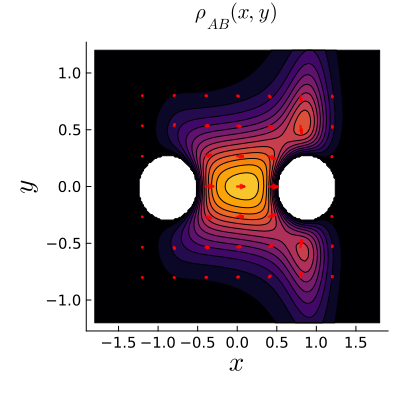

In [20]:
x = range(-1.2, 1.2, length=7);y = range(-0.8, 0.8, length=7);
x_mesh, y_mesh = meshgrid(x, y);
x = range(-1.8, 1.8, length=200);y = range(-1.2, 1.2, length=200);
p1 = contourf(x,y,tp1_mul_distribution2[:,1], title = L"\rho_{AB}(x,y)", xlab = L"x", ylab = L"y", size = (400,400), clim = (0, 0.6), legend = false,ytickfont=font(10), xtickfont=font(10), guidefont=font(18), legenfont = font(18), grid = false)
arrow0!.(x_mesh, y_mesh, tp1_mul_current2[:,1].*5, tp1_mul_current2[:,2].*5; as=0.5, lw=2.5,lc=:red, la=0.8);
Plots.current()
savefig("figure/2d_boundary_big.pdf")
p1